In [1]:
import numpy as np
from astropy.io import fits 
from scipy.ndimage import rotate
import glob
from tqdm import tqdm
import random
import matplotlib.pyplot as plt

In [2]:
def augment(files, m):

    array = np.empty([len(files)*m*2, 400, 400])
    rotation = np.linspace(0, 360, m, endpoint=False)
    it = 0
    i = 0
    pbar = tqdm(total=len(array))
    while i < len(files):
        image = fits.open(files[i])[0].data.squeeze() 
        average  = np.mean(image)
        minimum = np.min(image)        
        j = 0
        while j < m:        
            image_rot1 = rotate(image, rotation[j], reshape=False, cval = average)
            image_rot2 = np.fliplr(image_rot1)
            array[it] = image_rot1
            array[it+1] = image_rot2                    
            pbar.update(2)
            it+=2
            j+=1
        i+=1
        
    return array

In [3]:
def show_images(images, num):
    cols = 5
    rows = (num+cols-1)//cols
    plt.figure(figsize=(cols*4, rows*4))
    for i in range(num):
        ax = plt.subplot(rows, cols, i+1)
        image = images[i]
        plt.imshow(image, cmap='inferno')
        plt.axis('off')
    plt.show()

In [4]:
files1 = glob.glob(r"Raw Data\Filaments\cut*")
files2 = glob.glob(r"Raw Data\Not Filaments\cut*")

In [5]:
array1 = augment(files1, 28)

100%|█████████▉| 2350/2352 [01:07<00:00, 40.50it/s]

In [6]:
array2 = augment(files2, 3)


 56%|█████▌    | 1324/2358 [00:44<00:38, 26.74it/s]


100%|██████████| 2352/2352 [02:09<00:00, 18.13it/s]

100%|██████████| 2358/2358 [01:18<00:00, 24.42it/s]

100%|██████████| 2358/2358 [01:22<00:00, 28.65it/s]


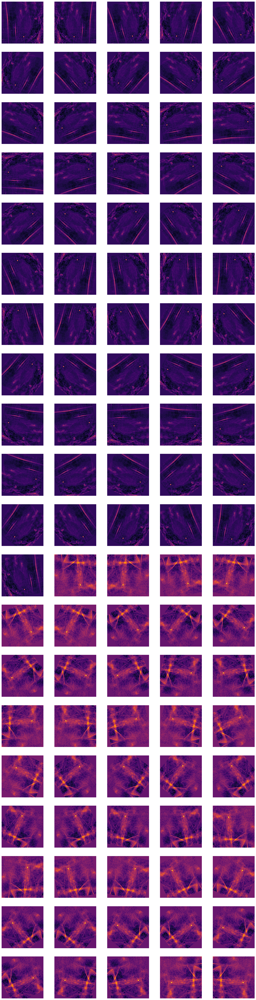

In [7]:
show_images(array1, 100)

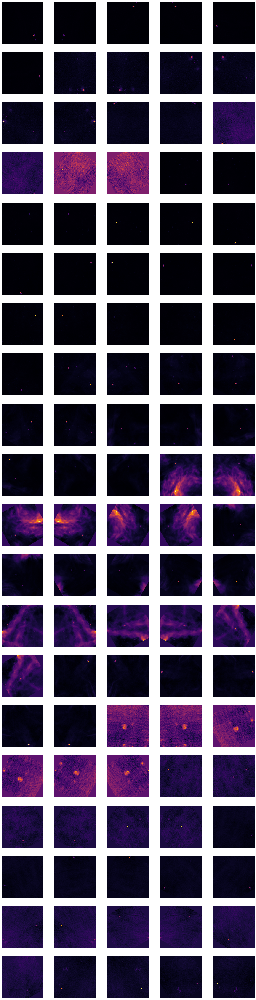

In [8]:
show_images(array2, 100)

In [11]:
np.save('filaments.npy', array1)
np.save('notfilaments.npy', array2)

In [12]:
np.min(array2)

4.8437882288029296e-20